>#  Install & Import all Dependencies


In [1]:
import subprocess
import os
wheels_path = "/kaggle/input/open-clip-wheels/open_clip_wheels"
open_clip_whl_path = f"{wheels_path}/open_clip_torch-2.14.0-py3-none-any.whl"

!pip install --no-index --find-links $wheels_path $open_clip_whl_path -q

In [2]:
import open_clip

In [3]:
import os
import sys
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt 

import numpy as np
import pandas as pd
import torch
import open_clip


sys.path.append('../input/sentence-transformers-222/sentence-transformers')
from sentence_transformers import SentenceTransformer, models

comp_path = Path('/kaggle/input/stable-diffusion-image-to-prompts/')

># Set Configs
>

In [4]:
class CFG:
    device = "cuda"
    seed = 42
    embedding_length = 384
    sentence_model_path = "/kaggle/input/sentence-transformers-222/all-MiniLM-L6-v2"
    model_name = "coca_ViT-L-14"
    model_checkpoint_path = "/kaggle/input/open-clip-models/mscoco_finetuned_CoCa-ViT-L-14-laion2B-s13B-b90k.bin"

># Load the Sample

In [5]:
df_submission = pd.read_csv('/kaggle/input/stable-diffusion-image-to-prompts/sample_submission.csv', index_col='imgId_eId')
df_submission.head()

,val
imgId_eId,
20057f34d_0,0.018848
20057f34d_1,0.030190
20057f34d_2,0.072792
20057f34d_3,-0.000673
20057f34d_4,0.016774


In [6]:
prompts_df = pd.read_csv("../input/stable-diffusion-image-to-prompts/prompts.csv")
prompts_df

,imgId,prompt
0,20057f34d,hyper realistic photo of very friendly and dys...
1,227ef0887,"ramen carved out of fractal rose ebony, in the..."
2,92e911621,ultrasaurus holding a black bean taco in the w...
3,a4e1c55a9,a thundering retro robot crane inks on parchme...
4,c98f79f71,"portrait painting of a shimmering greek hero, ..."
5,d8edf2e40,an astronaut standing on a engaging white rose...
6,f27825b2c,Kaggle employee Phil at a donut shop ordering ...


> # Load the Sample Submission

In [7]:
prompts_df.size

14

In [8]:
prompts_df.shape

(7, 2)

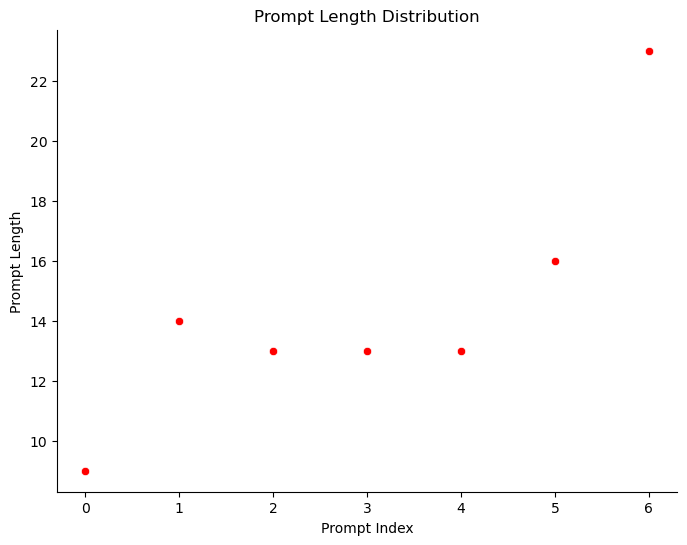

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

prompt_lengths = prompts_df["prompt"].apply(lambda x: len(x.split()))

fig, ax = plt.subplots(figsize=(8, 6))

sns.scatterplot(data=prompt_lengths, color="red", ax=ax)

ax.set_title("Prompt Length Distribution")
ax.set_xlabel("Prompt Index")
ax.set_ylabel("Prompt Length")

sns.despine()

plt.show()


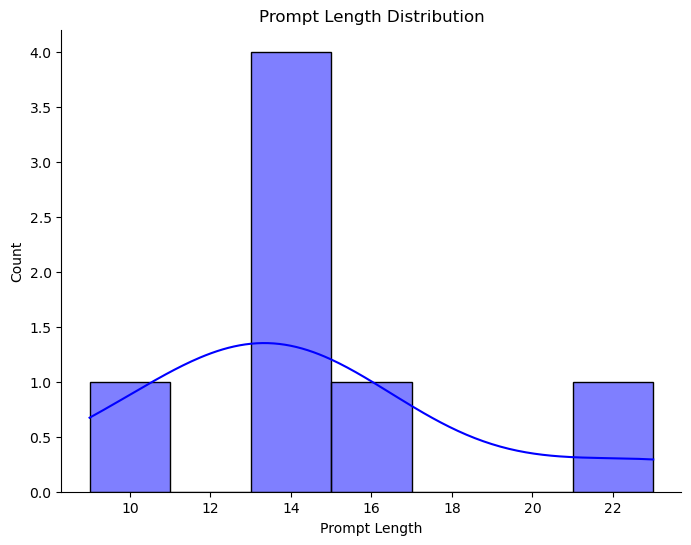

In [10]:
import seaborn as sns


prompt_lengths = prompts_df["prompt"].apply(lambda x: len(x.split()))


fig, ax = plt.subplots(figsize=(8, 6))


sns.histplot(prompt_lengths, kde=True, color="blue", ax=ax)


ax.set_title("Prompt Length Distribution")
ax.set_xlabel("Prompt Length")


sns.despine()

plt.show()


In [11]:
import os

def image_id2path(img_id: str, folder: str = "stable-diffusion-image-to-prompts") -> str:
    return os.path.join("..", "input", folder, "images", f"{img_id}.png")


In [12]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os

def show_images_and_prompts(
    df: pd.DataFrame,
    folder: str = "stable-diffusion-image-to-prompts",
    n: int = 10,
) -> None:
    fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(8, 8 * n))
    
    for i, (_, row) in enumerate(df[:n].iterrows()):
        img_id = row["imgId"]
        prompt = row["prompt"]
        path = image_id2path(img_id, folder)
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        ax = axes[i]
        ax.imshow(image)
        ax.axis("off")
        
        list_prompt_words = prompt.split()
        if len(prompt) > 100:
            _len = len(list_prompt_words)
            prompt = "{}\n{}\n{}".format(
                " ".join(list_prompt_words[:_len // 3]),
                " ".join(list_prompt_words[_len // 3 : 2 * _len // 3]),
                " ".join(list_prompt_words[2 * _len // 3:]),
            )
        elif len(prompt) > 50:
            _len = len(list_prompt_words)
            prompt = "{}\n{}".format(
                " ".join(list_prompt_words[:_len // 2]),
                " ".join(list_prompt_words[_len // 2:])
            )
        ax.set_title(prompt, fontsize=14)
    
    plt.tight_layout()
    plt.show()


In [13]:
df_prompts = None
if os.path.exists("../input/stable-diffusion-image-to-prompts/prompts.csv"):
    df_prompts = pd.read_csv("../input/stable-diffusion-image-to-prompts/prompts.csv")

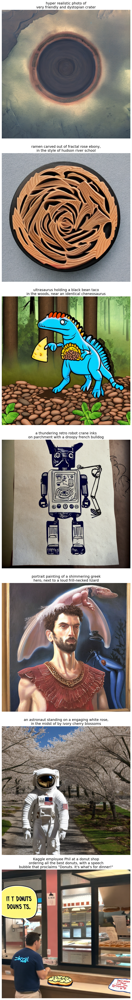

In [14]:
if df_prompts is not None:
    show_images_and_prompts(df_prompts, n=7)

In [15]:
import subprocess
import os
wheels_path = "/kaggle/input/open-clip-wheels/open_clip_wheels"
open_clip_whl_path = f"{wheels_path}/open_clip_torch-2.14.0-py3-none-any.whl"

!pip install --no-index --find-links $wheels_path $open_clip_whl_path -q

In [16]:
import open_clip

In [17]:
import os
import sys
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt 

import numpy as np
import pandas as pd
import torch
import open_clip


sys.path.append('../input/sentence-transformers-222/sentence-transformers')
from sentence_transformers import SentenceTransformer, models

comp_path = Path('/kaggle/input/stable-diffusion-image-to-prompts/')

In [18]:
class CFG:
    device = "cuda"
    seed = 42
    embedding_length = 384
    sentence_model_path = "/kaggle/input/sentence-transformers-222/all-MiniLM-L6-v2"
    model_name = "coca_ViT-L-14"
    model_checkpoint_path = "/kaggle/input/open-clip-models/mscoco_finetuned_CoCa-ViT-L-14-laion2B-s13B-b90k.bin"

># Construct an image-based index for easy reference

In [19]:
import os
df_submission = pd.read_csv('/kaggle/input/stable-diffusion-image-to-prompts/sample_submission.csv', index_col='imgId_eId')

# Get the list of images in the directory
images = os.listdir(comp_path / 'images')

# Initialize an empty list to store imgId_eId values
imgId_eId = []

# Iterate over each image ID and embedding ID combination
for imgId in images:
    for eId in range(CFG.embedding_length):
        # Concatenate the image ID and embedding ID and add it to the list
        imgId_eId.append(f"{imgId}_{eId}")

# Sort the imgId_eId list and df_submission.index for comparison
sorted_imgId_eId = sorted(imgId_eId)
sorted_df_submission_index = sorted(df_submission.index)





># Load the pre-trained embedding model into the system
# ↪  Define Configurations

In [20]:
sentra_mod = SentenceTransformer(CFG.sentence_model_path)

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [21]:
model = open_clip.create_model(CFG.model_name)
open_clip.load_checkpoint(model, CFG.model_checkpoint_path)

<All keys matched successfully>

In [22]:
transform = open_clip.image_transform(
    model.visual.image_size,
    is_train = False,
    mean = getattr(model.visual, 'image_mean', None),
    std = getattr(model.visual, 'image_std', None),
)

In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(device)

cuda


In [24]:
from PIL import Image
import torchvision.transforms as transforms
import torch

# Define the desired image transformations
image_transform = transforms.Compose([
    transforms.Resize((235, 235)),  
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize 
])

prompts = []
images_path = "../input/stable-diffusion-image-to-prompts/images/"
for image_name in images:
    image_path = images_path + image_name
    with Image.open(image_path).convert("RGB") as img:
        transformed_image = image_transform(img)

    transformed_image = transformed_image.unsqueeze(0).to(device)
    with torch.no_grad(), torch.cuda.amp.autocast():
        generated = model.generate(transformed_image)
    
    prompt = open_clip.decode(generated[0]).split("<end_of_text>")[0].replace("<start_of_text>", "").rstrip(" .,")
    prompts.append(prompt)

# Encode prompts for submission
prompt_embeddings = sentra_mod.encode(prompts).flatten()


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

# Evaluation

In [25]:
prompts

['a man standing in front of a donut shop',
 'an illustration of a dinosaur holding a piece of cheese',
 'a drawing of a robot holding a remote control',
 'an aerial view of a hole in the ground',
 'a person in a spacesuit is walking down the street',
 'a round wooden dish with a spiral design',
 'a painting of a man with a bird on his head']

In [26]:
predicted_prompts = pd.read_csv('../input/loremip-um/generated_prompt.csv', index_col='imgId')
display(predicted_prompts['prompt'].tolist())


['an aerial view of a hole in the ground',
 'a round wooden dish with a spiral design',
 'an illustration of a dinosaur holding a piece of cheese',
 'a drawing of a robot holding a remote control',
 'a painting of a man with a bird on his head',
 'a person in a spacesuit is walking down the street',
 'a man standing in front of a donut shop']

In [27]:
original_prompts = pd.read_csv("../input/stable-diffusion-image-to-prompts/prompts.csv", index_col='imgId')
display(original_prompts['prompt'].tolist())

['hyper realistic photo of very friendly and dystopian crater',
 'ramen carved out of fractal rose ebony, in the style of hudson river school',
 'ultrasaurus holding a black bean taco in the woods, near an identical cheneosaurus',
 'a thundering retro robot crane inks on parchment with a droopy french bulldog',
 'portrait painting of a shimmering greek hero, next to a loud frill-necked lizard',
 'an astronaut standing on a engaging white rose, in the midst of by ivory cherry blossoms',
 'Kaggle employee Phil at a donut shop ordering all the best donuts, with a speech bubble that proclaims "Donuts. It\'s what\'s for dinner!"']

In [28]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util

def cos_sim_on_list(original_prompts, predicted_prompts, sentra_mod):
    original_prompts_encoded = sentra_mod.encode(original_prompts, show_progress_bar=False)
    predicted_prompts_encoded = sentra_mod.encode(predicted_prompts, show_progress_bar=False)
    cosine_similarity_scores = util.cos_sim(predicted_prompts_encoded, original_prompts_encoded).numpy().diagonal()
    return cosine_similarity_scores

# Read the data
predicted_prompts = pd.read_csv('../input/loremip-um/generated_prompt.csv', index_col='imgId')
original_prompts = pd.read_csv("../input/stable-diffusion-image-to-prompts/prompts.csv", index_col='imgId')

# Convert data to lists
predicted_list = predicted_prompts['prompt'].tolist()
original_list = original_prompts['prompt'].tolist()

# Initialize the SentenceTransformer model
sentra_mod = SentenceTransformer(CFG.sentence_model_path)  

# Calculate cosine similarity scores
cos_sim_scores = cos_sim_on_list(original_list, predicted_list, sentra_mod)

print(cos_sim_scores)


[0.39330798 0.2033878  0.47551793 0.45152587 0.50021374 0.21892388
 0.50507104]


In [29]:
cos_sim_scores = cos_sim_on_list(original_list, predicted_list, sentra_mod)

In [30]:
predicted_prompts = pd.read_csv('../input/loremip-um/generated_prompt.csv', index_col='imgId')
original_prompts = pd.read_csv("../input/stable-diffusion-image-to-prompts/prompts.csv", index_col='imgId')
images_path = "../input/stable-diffusion-image-to-prompts/images/"
results = pd.DataFrame({
    "image_path": images_path + predicted_prompts.index.astype(str) + '.png',
    "original_prompt": original_prompts['prompt'],  # Select the 'prompt' column
    "predicted_prompt": predicted_prompts['prompt'],  # Select the 'prompt' column
    "cos_sim_score": cos_sim_scores,
})

results.head()


,image_path,original_prompt,predicted_prompt,cos_sim_score
imgId,,,,
20057f34d,../input/stable-diffusion-image-to-prompts/ima...,hyper realistic photo of very friendly and dys...,an aerial view of a hole in the ground,0.393308
227ef0887,../input/stable-diffusion-image-to-prompts/ima...,"ramen carved out of fractal rose ebony, in the...",a round wooden dish with a spiral design,0.203388
92e911621,../input/stable-diffusion-image-to-prompts/ima...,ultrasaurus holding a black bean taco in the w...,an illustration of a dinosaur holding a piece ...,0.475518
a4e1c55a9,../input/stable-diffusion-image-to-prompts/ima...,a thundering retro robot crane inks on parchme...,a drawing of a robot holding a remote control,0.451526
c98f79f71,../input/stable-diffusion-image-to-prompts/ima...,"portrait painting of a shimmering greek hero, ...",a painting of a man with a bird on his head,0.500214


In [31]:
results.to_csv('results.csv', index=False)

In [32]:
score = results.cos_sim_score.mean()
score

0.39256403

In [33]:
def add_text_limiters(text: str) -> str:
    return " ".join([
        word + "\n" if i % 15 == 0 else word 
        for i, word in enumerate(text.split(" "), start=1)
    ])

def plot_image(image: np.ndarray, original_prompt: str, gpredicted_prompt: str, cos_sim_score : float) -> None:
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.annotate(
        "Original prompt:\n" + add_text_limiters(original_prompt) + "\n\nPredicted prompt:\n" + add_text_limiters(predicted_prompt) + "\n\ncos_sim_score:\n" + add_text_limiters(str(cos_sim_score)), 
        xy=(1.05, 0.5), xycoords='axes fraction', ha='left', va='center', 
        fontsize=16, rotation=0, color="#104a6e"
    )

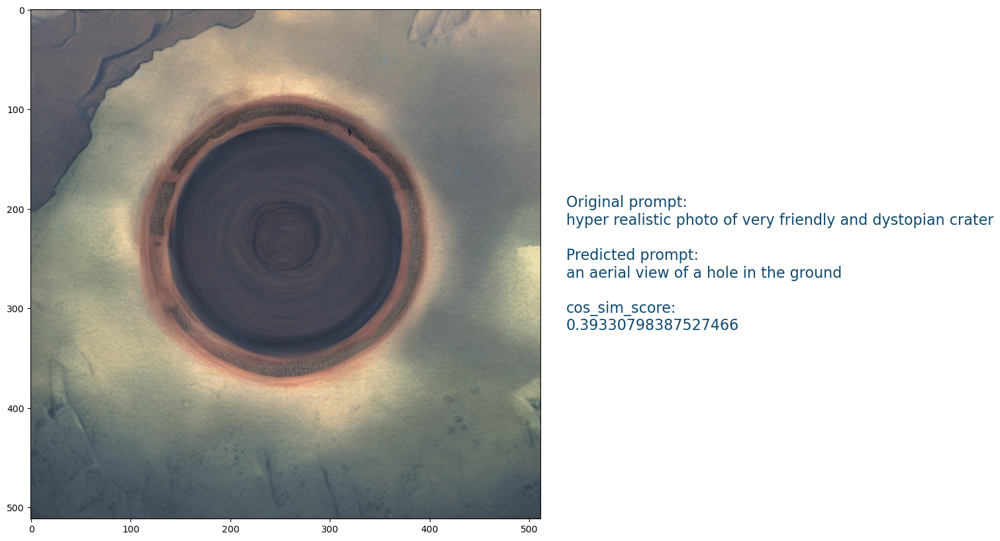

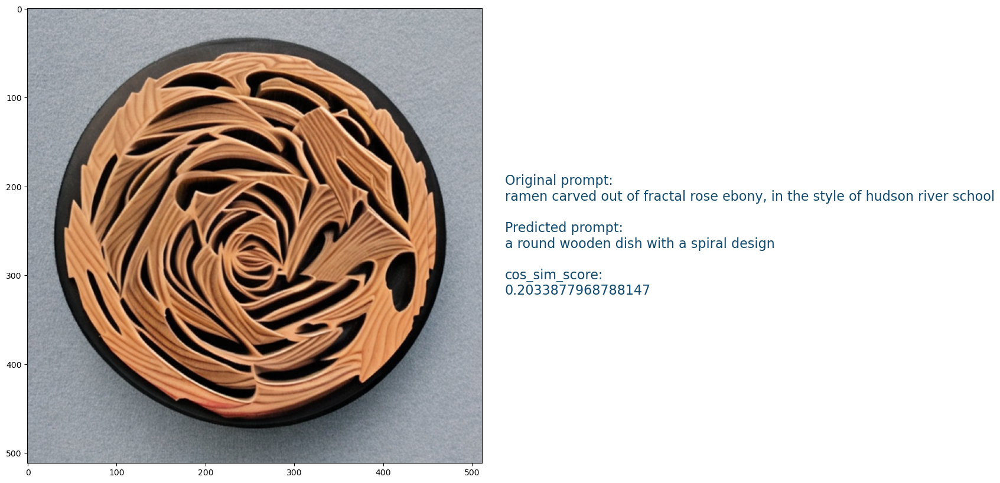

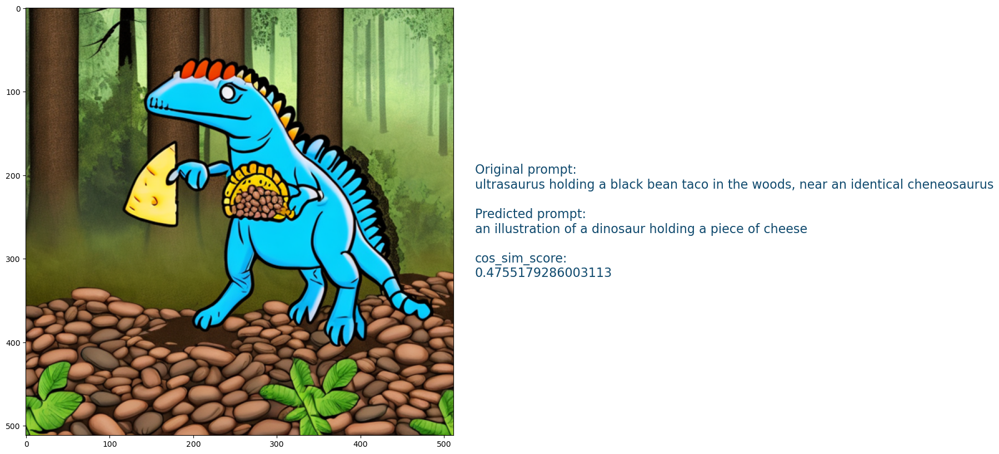

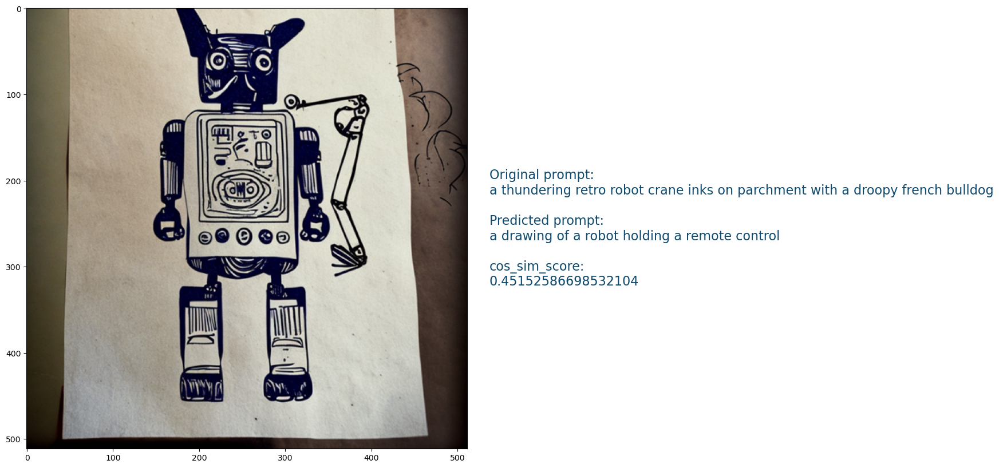

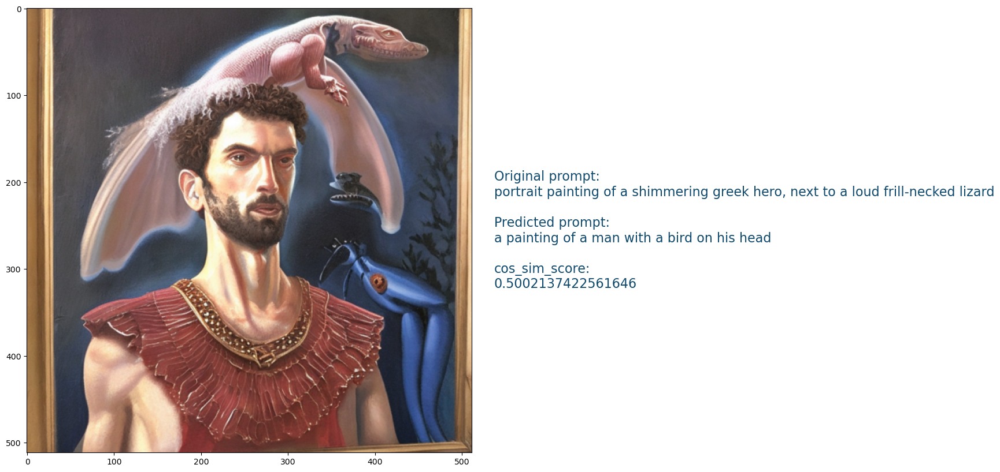

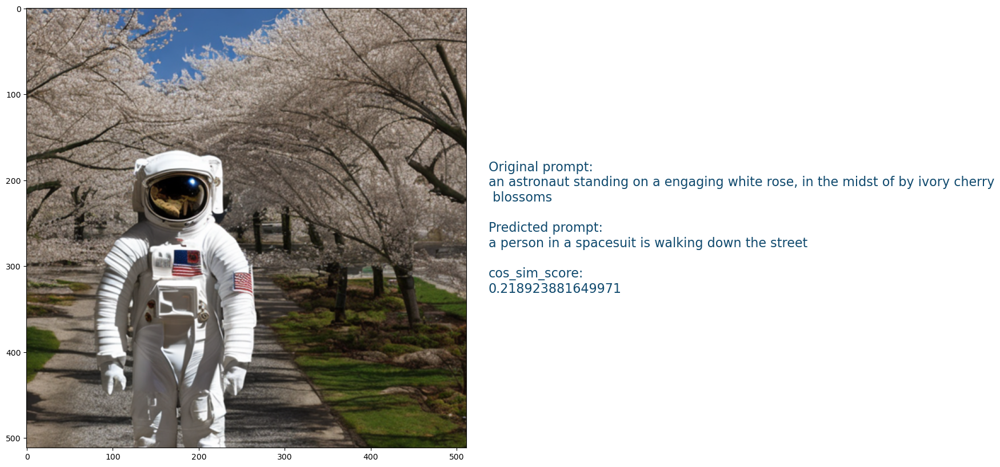

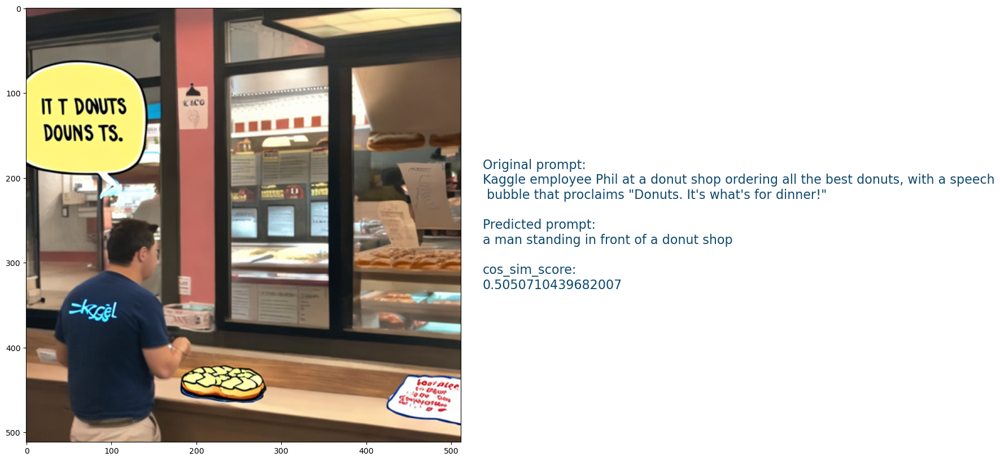

In [34]:
for index, row in results[:7].iterrows():
    image_path = row['image_path']
    original_prompt = row['original_prompt']
    predicted_prompt = row['predicted_prompt']
    cos_sim_score = row['cos_sim_score']
    img = Image.open(image_path).convert("RGB")
    plot_image(img, original_prompt, predicted_prompt, cos_sim_score)

In [35]:
submission = pd.DataFrame(
    index=imgId_eId,
    data=prompt_embeddings,
    columns=['val']
).rename_axis('imgId_eId').reset_index()

submission

,imgId_eId,val
0,f27825b2c.png_0,0.020267
1,f27825b2c.png_1,0.099165
2,f27825b2c.png_2,-0.013597
3,f27825b2c.png_3,-0.045828
4,f27825b2c.png_4,-0.005268
...,...,...
2683,c98f79f71.png_379,-0.073867
2684,c98f79f71.png_380,0.012851
2685,c98f79f71.png_381,0.028804
2686,c98f79f71.png_382,0.009999


In [36]:
submission.to_csv('submission.csv', index=False)

# Prompt Embeddings for the Stable Diffusion

In [37]:
import sys
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
import datetime as datetime
import matplotlib.dates as dates
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [38]:
sys.path.append('../input/sentence-transformers-222/sentence-transformers')
from sentence_transformers import SentenceTransformer, models

comp_path = Path('/kaggle/input/stable-diffusion-image-to-prompts/')

# Prompts used for the Images

In [39]:
prompts = pd.read_csv(comp_path / 'prompts.csv', index_col='imgId')
prompts.head(7)

,prompt
imgId,
20057f34d,hyper realistic photo of very friendly and dys...
227ef0887,"ramen carved out of fractal rose ebony, in the..."
92e911621,ultrasaurus holding a black bean taco in the w...
a4e1c55a9,a thundering retro robot crane inks on parchme...
c98f79f71,"portrait painting of a shimmering greek hero, ..."
d8edf2e40,an astronaut standing on a engaging white rose...
f27825b2c,Kaggle employee Phil at a donut shop ordering ...


In [40]:
sample_submission = pd.read_csv(comp_path / 'sample_submission.csv', index_col='imgId_eId')
sample_submission.head()

,val
imgId_eId,
20057f34d_0,0.018848
20057f34d_1,0.030190
20057f34d_2,0.072792
20057f34d_3,-0.000673
20057f34d_4,0.016774


># Evaluating Accuracy of Embeddings for Example Images in the Sample Submission

In [41]:
images = os.listdir(comp_path / 'images')
imgIds = [i.split('.')[0] for i in images]

eIds = list(range(CFG.embedding_length))

imgId_eId = [
    '_'.join(map(str, i)) for i in zip(
        np.repeat(imgIds, CFG.embedding_length),
        np.tile(range(CFG.embedding_length), len(imgIds))
    )
]

assert sorted(imgId_eId) == sorted(df_submission.index)

In [42]:
sentra_mod = SentenceTransformer(CFG.sentence_model_path)

In [43]:
texts=prompts['prompt'].tolist()
encods=[]
for text in texts:
    encods+=[np.array(sentra_mod.encode(text))[0:50]]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

# Generate an Enhanced Visualization of Prompt Embedding Values (50 dimensions out of a 384-dimensional vector)

In [44]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": False}]])

for i in range(len(encods)):
    encode = encods[i]
    fig.add_trace(go.Scatter(x=list(range(50)), y=encode, name=texts[i][0:10], mode='lines+markers'), secondary_y=False)

fig.update_layout(autosize=False, width=800, height=500, title_text="Prompt Embedding Values")
fig.update_xaxes(title_text="index")
fig.update_yaxes(title_text="value", secondary_y=False)
fig.show()

># Heatmap Visualization 

In [45]:
import plotly.graph_objects as go

data = [go.Heatmap(z=encods, x=list(range(50)), y=texts, colorscale='Viridis')]

fig = go.Figure(data)
fig.update_layout(
    width=1000,
    height=562.5,
    title_text="Prompt Embedding Values",
    xaxis_title="Index",
    yaxis_title="Text"
)
fig.show()

In [46]:
texts2=['apple','book','apple book','book apple']
encods2=[]
for text in texts2:
    encods2+=[np.array(sentra_mod.encode(text))[0:50]]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

># Bar Graph Visualization 

In [47]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": False}]])

for i in range(len(encods2)):
    encode = encods2[i]
    fig.add_trace(go.Scatter(x=list(range(50)), y=encode, name=texts2[i], mode='lines+markers'), secondary_y=False)

fig.update_layout(autosize=False, width=800, height=500, title_text="Prompt Embedding Values")
fig.update_xaxes(title_text="index")
fig.update_yaxes(title_text="value", secondary_y=False)
fig.show()


In [48]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": False}]])

for i in range(len(encods2)):
    encode = encods2[i]
    fig.add_trace(go.Bar(x=list(range(50)), y=encode, name=texts2[i]), secondary_y=False)

fig.update_layout(autosize=False, width=1000, height=562.5, title_text="Prompt Embedding Values")
fig.update_xaxes(title_text="Index")
fig.update_yaxes(title_text="Value", secondary_y=False)
fig.show()


In [49]:
comp_path = Path('/kaggle/input/loremip-um/')
prompts = pd.read_csv(comp_path / 'generated_prompt.csv', index_col='imgId')
display(prompts['prompt'].tolist())

['an aerial view of a hole in the ground',
 'a round wooden dish with a spiral design',
 'an illustration of a dinosaur holding a piece of cheese',
 'a drawing of a robot holding a remote control',
 'a painting of a man with a bird on his head',
 'a person in a spacesuit is walking down the street',
 'a man standing in front of a donut shop']

># Evaluating Accuracy of Embeddings for Example Images in the Generated Submission & Prompts

In [50]:
comp_path = Path('/kaggle/input/loremip-um/')
sample_submission = pd.read_csv(comp_path /'submission .csv', index_col='imgId_eId')
sample_submission.head()

,val
imgId_eId,
f27825b2c.png_0,0.020267
f27825b2c.png_1,0.099165
f27825b2c.png_2,-0.013597
f27825b2c.png_3,-0.045828
f27825b2c.png_4,-0.005268


In [51]:
df_submission = pd.read_csv('/kaggle/input/loremip-um/submission .csv', index_col='imgId_eId')
df_submission.head()

,val
imgId_eId,
f27825b2c.png_0,0.020267
f27825b2c.png_1,0.099165
f27825b2c.png_2,-0.013597
f27825b2c.png_3,-0.045828
f27825b2c.png_4,-0.005268


In [52]:
sentra_mod = SentenceTransformer(CFG.sentence_model_path)

In [53]:
texts=prompts['prompt'].tolist()
encods=[]
for text in texts:
    encods+=[np.array(sentra_mod.encode(text))[0:50]]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

# Generate an Enhanced Visualization of Prompt Embedding Values (50 dimensions out of a 384-dimensional vector)

In [54]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": False}]])

for i in range(len(encods)):
    encode = encods[i]
    fig.add_trace(go.Scatter(x=list(range(50)), y=encode, name=texts[i][0:10], mode='lines+markers'), secondary_y=False)

fig.update_layout(autosize=False, width=800, height=500, title_text="Prompt Embedding Values")
fig.update_xaxes(title_text="index")
fig.update_yaxes(title_text="value", secondary_y=False)
fig.show()

># Heatmap Visualization 

In [55]:
import plotly.graph_objects as go

data = [go.Heatmap(z=encods, x=list(range(50)), y=texts, colorscale='Viridis')]

fig = go.Figure(data)
fig.update_layout(
    width=1000,
    height=562.5,
    title_text="Prompt Embedding Values",
    xaxis_title="Index",
    yaxis_title="Text"
)
fig.show()